In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, plot_ccf
from statsmodels.tsa.stattools import ccf
from scipy.stats import uniform, randint

color_pal = sns.color_palette()
plt.style.use("fivethirtyeight")

# Do XGBoost but compare recursion with model train for every t steps ahead.

In [2]:
df = pd.read_csv('./data/daily.csv')
df = df.set_index('date')
df.index = pd.to_datetime(df.index)

In [3]:
def create_date_features(df):
    df = df.copy()
    df['year'] = df.index.year
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['week'] = df.index.isocalendar().week
    df['dayofyear'] = df.index.dayofyear
    return df

def clean_nas(df):
    df = df.copy()
    df.ffill(inplace=True)
    df.dropna(inplace=True)
    return df

In [4]:
df = create_date_features(df)
df = clean_nas(df)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12584 entries, 1990-01-01 to 2024-06-14
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   TAVG_flag       12584 non-null  object 
 1   TAVG_origFlag   12584 non-null  object 
 2   TAVG_origValue  12584 non-null  float64
 3   TAVG_value      12584 non-null  float64
 4   WTEQ_average    12584 non-null  float64
 5   WTEQ_flag       12584 non-null  object 
 6   WTEQ_origFlag   12584 non-null  object 
 7   WTEQ_origValue  12584 non-null  float64
 8   WTEQ_value      12584 non-null  float64
 9   agency_cd       12584 non-null  object 
 10  site_no         12584 non-null  int64  
 11  CFS             12584 non-null  int64  
 12  status          12584 non-null  object 
 13  year            12584 non-null  int32  
 14  quarter         12584 non-null  int32  
 15  month           12584 non-null  int32  
 16  week            12584 non-null  UInt32 
 17  dayofyear     

# Exploration and TS Analysis

In [5]:
TARGET = 'CFS'
FEATURES = ['TAVG_origValue', 'WTEQ_average', 'WTEQ_origValue',
            'year', 'quarter', 'month', 'week', 'dayofyear']
df = df[[*FEATURES, TARGET]]
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12584 entries, 1990-01-01 to 2024-06-14
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   TAVG_origValue  12584 non-null  float64
 1   WTEQ_average    12584 non-null  float64
 2   WTEQ_origValue  12584 non-null  float64
 3   year            12584 non-null  int32  
 4   quarter         12584 non-null  int32  
 5   month           12584 non-null  int32  
 6   week            12584 non-null  UInt32 
 7   dayofyear       12584 non-null  int32  
 8   CFS             12584 non-null  int64  
dtypes: UInt32(1), float64(3), int32(4), int64(1)
memory usage: 749.6 KB


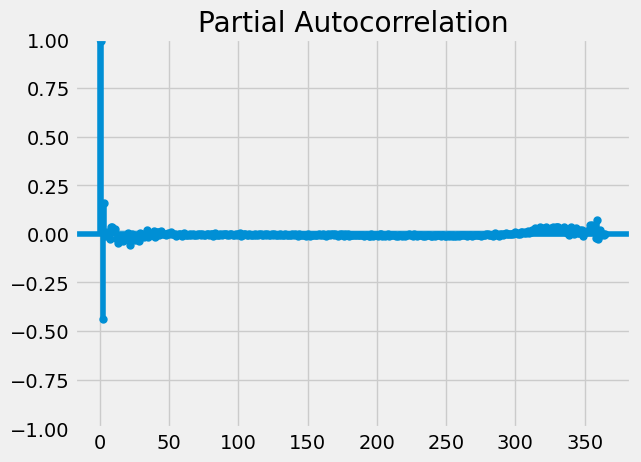

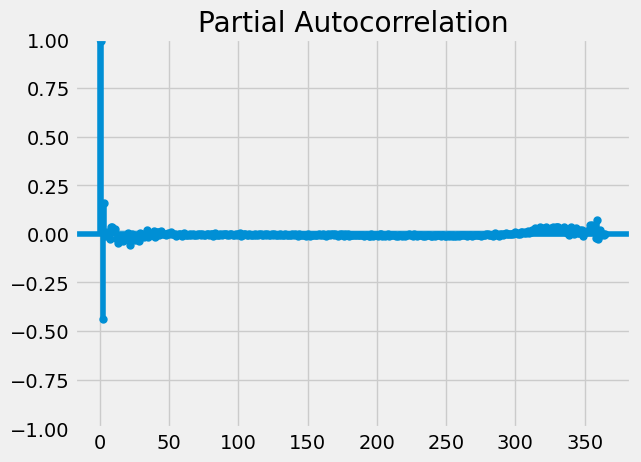

In [6]:
plot_pacf(df['CFS'], lags=365)

## Make features

In [7]:
def add_cfs_lags(df):
    target_map = df['CFS'].to_dict()
    df['CFS_lag1'] = (df.index - pd.Timedelta('1 days')).map(target_map)
    df['CFS_lag2'] = (df.index - pd.Timedelta('2 days')).map(target_map)
    df['CFS_lag3'] = (df.index - pd.Timedelta('3 days')).map(target_map)
    df['CFS_lag365'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    return df

def add_temp_lags(df):
    target_map = df['TAVG_origValue'].to_dict()
    df['TAVG_lag1'] = (df.index - pd.Timedelta('1 days')).map(target_map)
    df['TAVG_lag2'] = (df.index - pd.Timedelta('2 days')).map(target_map)
    df['TAVG_lag3'] = (df.index - pd.Timedelta('3 days')).map(target_map)
    df['TAVG_lag365'] = (df.index - pd.Timedelta('365 days')).map(target_map)
    return df

def add_first_difference(df, column_name='WTEQ_origValue'):
    if column_name not in df.columns:
        raise ValueError(f"Column '{column_name}' does not exist in the DataFrame")

    diff_column_name = f'{column_name}_diff'
    df[diff_column_name] = df[column_name].diff()

    return df

In [8]:
df = add_cfs_lags(df)
df = add_temp_lags(df)
df = add_first_difference(df)

In [9]:
df.head()
df.tail()

,TAVG_origValue,WTEQ_average,WTEQ_origValue,year,quarter,month,week,dayofyear,CFS,CFS_lag1,CFS_lag2,CFS_lag3,CFS_lag365,TAVG_lag1,TAVG_lag2,TAVG_lag3,TAVG_lag365,WTEQ_origValue_diff
date,,,,,,,,,,,,,,,,,,
2024-06-10,43.7,12.3,9.8,2024,2,6,24,162,5360,4460.0,4600.0,4450.0,3220.0,45.9,47.3,46.8,44.8,-1.4
2024-06-11,47.3,11.9,8.3,2024,2,6,24,163,4540,5360.0,4460.0,4600.0,3120.0,43.7,45.9,47.3,42.8,-1.5
2024-06-12,48.4,11.3,7.0,2024,2,6,24,164,4140,4540.0,5360.0,4460.0,3050.0,47.3,43.7,45.9,45.9,-1.3
2024-06-13,49.3,10.7,5.6,2024,2,6,24,165,3680,4140.0,4540.0,5360.0,2970.0,48.4,47.3,43.7,44.2,-1.4
2024-06-14,52.0,10.1,4.0,2024,2,6,24,166,3390,3680.0,4140.0,4540.0,3060.0,49.3,48.4,47.3,40.5,-1.6


# Run XGB with cv

In [10]:
splits = 12
tss = TimeSeriesSplit(n_splits=splits, test_size=365, gap=0)
df = df.sort_index()

fold = 0
preds = []
scores = []
mapes = []
for train_idx, val_idx in tss.split(df):
    train = df.iloc[train_idx]
    test = df.iloc[val_idx]
    TARGET = 'CFS'
    FEATURES = ['WTEQ_average', 'WTEQ_origValue', 'CFS_lag1', 'CFS_lag2',
                'TAVG_origValue', 'TAVG_lag1', 'TAVG_lag2',
                'WTEQ_origValue_diff', 'month', 'week', 'dayofyear']

    X_train = train[FEATURES]
    y_train = np.log(train[TARGET])

    X_test = test[FEATURES]
    y_test = np.log(test[TARGET])

    reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree',
                          n_estimators=1000, early_stopping_rounds=50,
                          objective='reg:squarederror', max_depth=3, learning_rate=.01)
    reg.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)],
           verbose=100)
    
    y_pred = reg.predict(X_test)
    preds.append(y_pred)
    score = np.sqrt(mean_squared_error(y_test, y_pred)) # NOTE! non-exponentiated: ie log units
    mape = mean_absolute_percentage_error(np.exp(y_test), np.exp(y_pred)) # NOTE! exponentiated: ie normal CFS
    scores.append(score)
    mapes.append(mape)
    fold += 1
    print(f'#### Finished fold {fold} of {splits} ####')
print(f'RMSE Avg across folds {np.mean(scores):0.4f}')
print(f'MAPE Avg across foles {np.mean(mapes):0.4f}')

[0]	validation_0-rmse:5.80313	validation_1-rmse:5.71826


[100]	validation_0-rmse:2.12885	validation_1-rmse:2.09443
[200]	validation_0-rmse:0.78414	validation_1-rmse:0.76943
[300]	validation_0-rmse:0.29513	validation_1-rmse:0.28254
[400]	validation_0-rmse:0.12394	validation_1-rmse:0.11093
[500]	validation_0-rmse:0.07282	validation_1-rmse:0.06130
[600]	validation_0-rmse:0.06117	validation_1-rmse:0.05253
[700]	validation_0-rmse:0.05832	validation_1-rmse:0.05121
[800]	validation_0-rmse:0.05696	validation_1-rmse:0.05096
[900]	validation_0-rmse:0.05599	validation_1-rmse:0.05075
[999]	validation_0-rmse:0.05518	validation_1-rmse:0.05066
#### Finished fold 1 of 12 ####
[0]	validation_0-rmse:5.79954	validation_1-rmse:5.73513
[100]	validation_0-rmse:2.12743	validation_1-rmse:2.10799
[200]	validation_0-rmse:0.78354	validation_1-rmse:0.77690
[300]	validation_0-rmse:0.29482	validation_1-rmse:0.28957
[400]	validation_0-rmse:0.12366	validation_1-rmse:0.11572
[500]	validation_0-rmse:0.07250	validation_1-rmse:0.06371
[600]	validation_0-rmse:0.06081	validation

In [11]:
print(f'RMSE Avg across folds {np.mean(scores):0.4f}')
print(f'MAPE Avg across foles {np.mean(mapes):0.4f}')
print(f'\n Scores: {scores}')
print(f'\n MAPES: {(mapes)}')

RMSE Avg across folds 0.0578
MAPE Avg across foles 0.0393

 Scores: [np.float64(0.050659674642445064), np.float64(0.05337957271014137), np.float64(0.06388252421891075), np.float64(0.05529019761353159), np.float64(0.0787760101028071), np.float64(0.05285625311219342), np.float64(0.053982813529488236), np.float64(0.05604182883360551), np.float64(0.053075874719041086), np.float64(0.06853573226626551), np.float64(0.048109939800285134), np.float64(0.05938300015023662)]

 MAPES: [0.03656784237134168, 0.03818932448810811, 0.04456698075413947, 0.03942365871870976, 0.04410679116303201, 0.03770066850660946, 0.03677077466555635, 0.03912141928079541, 0.037563949690722416, 0.043074810067154815, 0.0343213030284172, 0.04031335568739129]


## Hyperparameter tuning:

In [12]:
splits = 12
tss = TimeSeriesSplit(n_splits=splits, test_size=365, gap=0)
df = df.sort_index()
# Also holdout this year
cutoff = pd.to_datetime('2024-01-01')
df_holdout = df.loc[df.index > cutoff]
df_train = df.loc[df.index <= cutoff]


fold = 0
preds = []
scores = []
mapes = []
best_params = []

param_dist = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(1, 10),
    'learning_rate': uniform(0.01, 0.3),
    'subsample': uniform(0.6, 0.4),
    'colsample_bytree': uniform(0.6, 0.4),
    'min_child_weight': randint(1, 10),
    'gamma': uniform(0, 0.5),
    'alpha': uniform(0, 1),
    'lambda': uniform(0, 1),
}

TARGET = 'CFS'
FEATURES = ['WTEQ_average', 'WTEQ_origValue', 'CFS_lag1', 'CFS_lag2',
            'TAVG_origValue', 'TAVG_lag1', 'TAVG_lag2',
            'WTEQ_origValue_diff', 'month', 'week', 'dayofyear']

for train_idx, val_idx in tss.split(df_train):
    train = df.iloc[train_idx]
    test = df.iloc[val_idx]

    X_train = train[FEATURES]
    y_train = np.log(train[TARGET])

    X_test = test[FEATURES]
    y_test = np.log(test[TARGET])

    xgb_model = xgb.XGBRegressor(objective='reg:squarederror', base_score=0.5, booster='gbtree')

    # Set up RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=xgb_model,
        param_distributions=param_dist,
        n_iter=100,
        cv=3,
        verbose=1,
        n_jobs=-1,
        random_state=42
    )

    random_search.fit(X_train, y_train)

    best_model = random_search.best_estimator_

    y_pred = best_model.predict(X_test)
    preds.append(y_pred)

    # Calculate metrics
    score = np.exp(np.sqrt(mean_squared_error(y_test, y_pred)))
    mape = mean_absolute_percentage_error(np.exp(y_test), np.exp(y_pred))
    scores.append(score)
    mapes.append(mape)
    best_params.append(random_search.best_params_)

    fold += 1
    print(f'#### Finished fold {fold} of {splits} ####')
    print(f'Best parameters: {random_search.best_params_}')
    print(f'e^RMSE: {score}')
    print(f'MAPE: {mape}')
    print('-------------------')

# Print overall results
print(f'Average RMSE: {np.mean(scores)}')
print(f'Average MAPE: {np.mean(mapes)}')

Fitting 3 folds for each of 100 candidates, totalling 300 fits
#### Finished fold 1 of 12 ####
Best parameters: {'alpha': np.float64(0.2721322493846353), 'colsample_bytree': np.float64(0.8590760482165449), 'gamma': np.float64(0.0002601884976579094), 'lambda': np.float64(0.352568856334169), 'learning_rate': np.float64(0.1014343774474087), 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 510, 'subsample': np.float64(0.7669644012595116)}
e^RMSE: 1.0481655619952501
MAPE: 0.03336204753392619
-------------------
Fitting 3 folds for each of 100 candidates, totalling 300 fits
#### Finished fold 2 of 12 ####
Best parameters: {'alpha': np.float64(0.2721322493846353), 'colsample_bytree': np.float64(0.8590760482165449), 'gamma': np.float64(0.0002601884976579094), 'lambda': np.float64(0.352568856334169), 'learning_rate': np.float64(0.1014343774474087), 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 510, 'subsample': np.float64(0.7669644012595116)}
e^RMSE: 1.0543174217375382
MAPE: 0.03

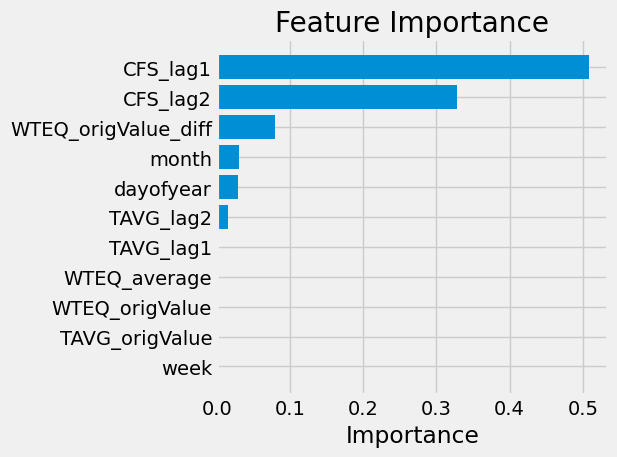

In [13]:
importance = best_model.feature_importances_
sorted_idx = importance.argsort()
plt.barh(range(len(sorted_idx)), importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), [FEATURES[i] for i in sorted_idx])
plt.xlabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()
plt.show()

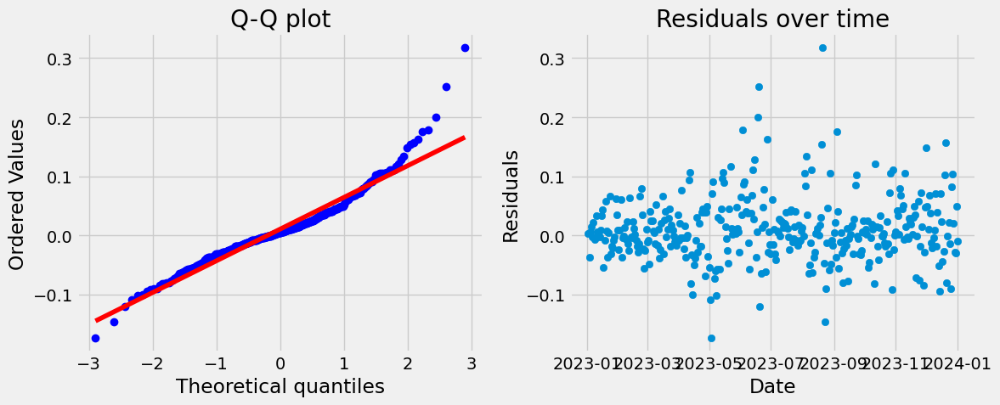

In [14]:
import scipy.stats as stats

residuals = y_test - y_pred
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

stats.probplot(residuals, dist="norm", plot=ax1)
ax1.set_title("Q-Q plot")

ax2.scatter(test.index, residuals)
ax2.set_title("Residuals over time")
ax2.set_xlabel("Date")
ax2.set_ylabel("Residuals")

plt.tight_layout()
plt.show()

## Checkout forecast for 2024

In [15]:
best_params = {'alpha': np.float64(0.2721322493846353), 'colsample_bytree': np.float64(0.8590760482165449), 'gamma': np.float64(0.0002601884976579094), 'lambda': np.float64(0.352568856334169), 'learning_rate': np.float64(0.1014343774474087), 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 510, 'subsample': np.float64(0.7669644012595116)}

cutoff = pd.to_datetime("2024-01-01")
df_holdout = df.loc[df.index > cutoff]
full_model = xgb.XGBRegressor(objective='reg:squarederror', base_score=0.5, booster='gbtree', **best_params)
full_model.fit(df[FEATURES], np.log(df[TARGET]))
future = pd.date_range("2024-01-02", "2024-06-14", freq="1d")
future_df = pd.DataFrame(index=future)
future_df['is_future'] = True
future_df['CFS'] = df.loc[df.index > cutoff]["CFS"]
for f in FEATURES:
    future_df[f] = df_holdout[f]

df['is_future'] = False
df_and_future = pd.concat([df, future_df])
df_and_future['CFS_pred'] = np.exp(full_model.predict(df_and_future[FEATURES]))

In [16]:
df.tail()

,TAVG_origValue,WTEQ_average,WTEQ_origValue,year,quarter,month,week,dayofyear,CFS,CFS_lag1,CFS_lag2,CFS_lag3,CFS_lag365,TAVG_lag1,TAVG_lag2,TAVG_lag3,TAVG_lag365,WTEQ_origValue_diff,is_future
date,,,,,,,,,,,,,,,,,,,
2024-06-10,43.7,12.3,9.8,2024,2,6,24,162,5360,4460.0,4600.0,4450.0,3220.0,45.9,47.3,46.8,44.8,-1.4,False
2024-06-11,47.3,11.9,8.3,2024,2,6,24,163,4540,5360.0,4460.0,4600.0,3120.0,43.7,45.9,47.3,42.8,-1.5,False
2024-06-12,48.4,11.3,7.0,2024,2,6,24,164,4140,4540.0,5360.0,4460.0,3050.0,47.3,43.7,45.9,45.9,-1.3,False
2024-06-13,49.3,10.7,5.6,2024,2,6,24,165,3680,4140.0,4540.0,5360.0,2970.0,48.4,47.3,43.7,44.2,-1.4,False
2024-06-14,52.0,10.1,4.0,2024,2,6,24,166,3390,3680.0,4140.0,4540.0,3060.0,49.3,48.4,47.3,40.5,-1.6,False


In [17]:
df_and_future.tail(170)

,TAVG_origValue,WTEQ_average,WTEQ_origValue,year,quarter,month,week,dayofyear,CFS,CFS_lag1,CFS_lag2,CFS_lag3,CFS_lag365,TAVG_lag1,TAVG_lag2,TAVG_lag3,TAVG_lag365,WTEQ_origValue_diff,is_future,CFS_pred
2024-06-10,43.7,12.3,9.8,2024.0,2.0,6,24,162,5360,4460.0,4600.0,4450.0,3220.0,45.9,47.3,46.8,44.8,-1.4,False,4680.500977
2024-06-11,47.3,11.9,8.3,2024.0,2.0,6,24,163,4540,5360.0,4460.0,4600.0,3120.0,43.7,45.9,47.3,42.8,-1.5,False,4690.183594
2024-06-12,48.4,11.3,7.0,2024.0,2.0,6,24,164,4140,4540.0,5360.0,4460.0,3050.0,47.3,43.7,45.9,45.9,-1.3,False,4193.305664
2024-06-13,49.3,10.7,5.6,2024.0,2.0,6,24,165,3680,4140.0,4540.0,5360.0,2970.0,48.4,47.3,43.7,44.2,-1.4,False,3728.102783
2024-06-14,52.0,10.1,4.0,2024.0,2.0,6,24,166,3390,3680.0,4140.0,4540.0,3060.0,49.3,48.4,47.3,40.5,-1.6,False,3492.822266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-10,43.7,12.3,9.8,NaN,NaN,6,24,162,5360,4460.0,4600.0,NaN,NaN,45.9,47.3,NaN,NaN,-1.4,True,4680.500977
2024-06-11,47.3,11.9,8.3,NaN,NaN,6,24,163,4540,5360.0,4460.0,NaN,NaN,43.7,45.9,NaN,NaN,-1.5,True,4690.183594
2024-06-12,48.4,11.3,7.0,NaN,NaN,6,24,164,4140,4540.0,5360.0,NaN,NaN,47.3,43.7,NaN,NaN,-1.3,True,4193.305664
2024-06-13,49.3,10.7,5.6,NaN,NaN,6,24,165,3680,4140.0,4540.0,NaN,NaN,48.4,47.3,NaN,NaN,-1.4,True,3728.102783


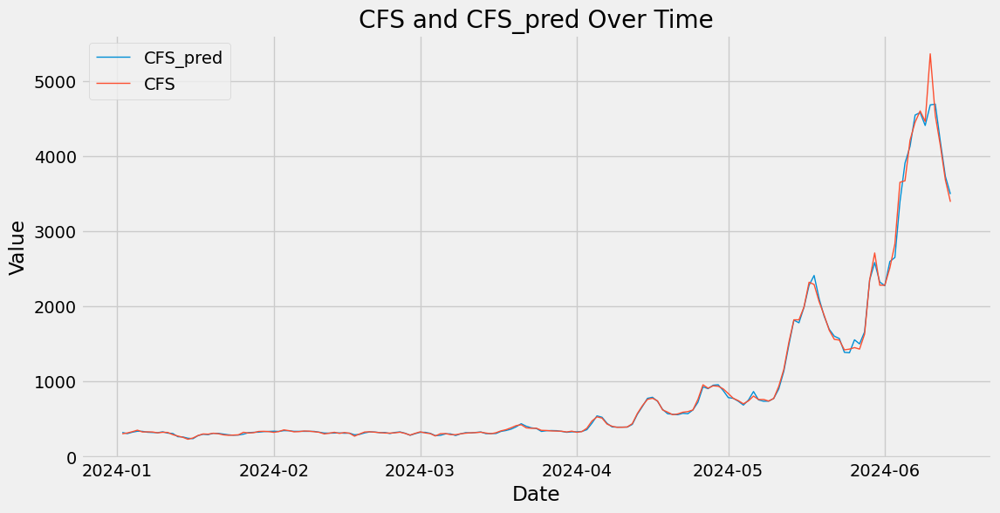

In [18]:
future_data = df_and_future.query('is_future')

plt.figure(figsize=(12, 6))
plt.plot(future_data.index, future_data['CFS_pred'], label='CFS_pred', lw=1)
plt.plot(future_data.index, future_data['CFS'], label='CFS', lw=1)

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('CFS and CFS_pred Over Time')
plt.legend()
plt.show()

In [19]:
print(f"MAPE: {mean_absolute_percentage_error(future_data['CFS'], future_data['CFS_pred'])}")

MAPE: 0.023623093962669373


## Do model for every t+n future days

In [20]:
best_params = {'alpha': np.float64(0.2721322493846353), 'colsample_bytree': np.float64(0.8590760482165449), 'gamma': np.float64(0.0002601884976579094), 'lambda': np.float64(0.352568856334169), 'learning_rate': np.float64(0.1014343774474087), 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 510, 'subsample': np.float64(0.7669644012595116)}

n_future_models = 31
future_models = {}
for n in range(n_future_models):
    full_model = xgb.XGBRegressor(objective='reg:squarederror', base_score=0.5, booster='gbtree', **best_params)
    df_train_shift = df.copy()
    df_train_shift['CFS'] = (df.index + pd.Timedelta(f'{n} days')).map(df['CFS'].to_dict())
    df_train_shift = clean_nas(df_train_shift)
    full_model.fit(df_train_shift[FEATURES], np.log(df_train_shift[TARGET]))
    future_models[f't+{n}'] = full_model
    df_and_future[f'CFS_pred{n}ahead'] = np.exp(full_model.predict(df_and_future[FEATURES]))

In [21]:
df_and_future.tail()

,TAVG_origValue,WTEQ_average,WTEQ_origValue,year,quarter,month,week,dayofyear,CFS,CFS_lag1,...,CFS_pred21ahead,CFS_pred22ahead,CFS_pred23ahead,CFS_pred24ahead,CFS_pred25ahead,CFS_pred26ahead,CFS_pred27ahead,CFS_pred28ahead,CFS_pred29ahead,CFS_pred30ahead
2024-06-10,43.7,12.3,9.8,NaN,NaN,6,24,162,5360,4460.0,...,2971.513428,2877.171387,2865.328369,2832.513428,2862.190430,2816.855713,2658.887451,2757.400879,2745.366211,2815.146240
2024-06-11,47.3,11.9,8.3,NaN,NaN,6,24,163,4540,5360.0,...,2860.617188,2604.676270,2717.067871,2912.997070,2709.256348,2830.990479,2637.083984,2812.150391,2596.560059,2610.663330
2024-06-12,48.4,11.3,7.0,NaN,NaN,6,24,164,4140,4540.0,...,2931.110596,2830.393799,2899.256104,2871.020508,2840.595215,2836.182861,2865.190430,3000.632812,3044.443359,2906.814209
2024-06-13,49.3,10.7,5.6,NaN,NaN,6,24,165,3680,4140.0,...,2627.129883,2645.190674,2836.641357,2799.027832,2733.832520,2703.705566,2730.475342,2832.198975,2768.817383,2632.461670
2024-06-14,52.0,10.1,4.0,NaN,NaN,6,24,166,3390,3680.0,...,2458.194336,2481.208740,2512.192871,2344.716064,2476.535156,2361.182129,2386.676270,2519.711426,2310.480225,2356.305420


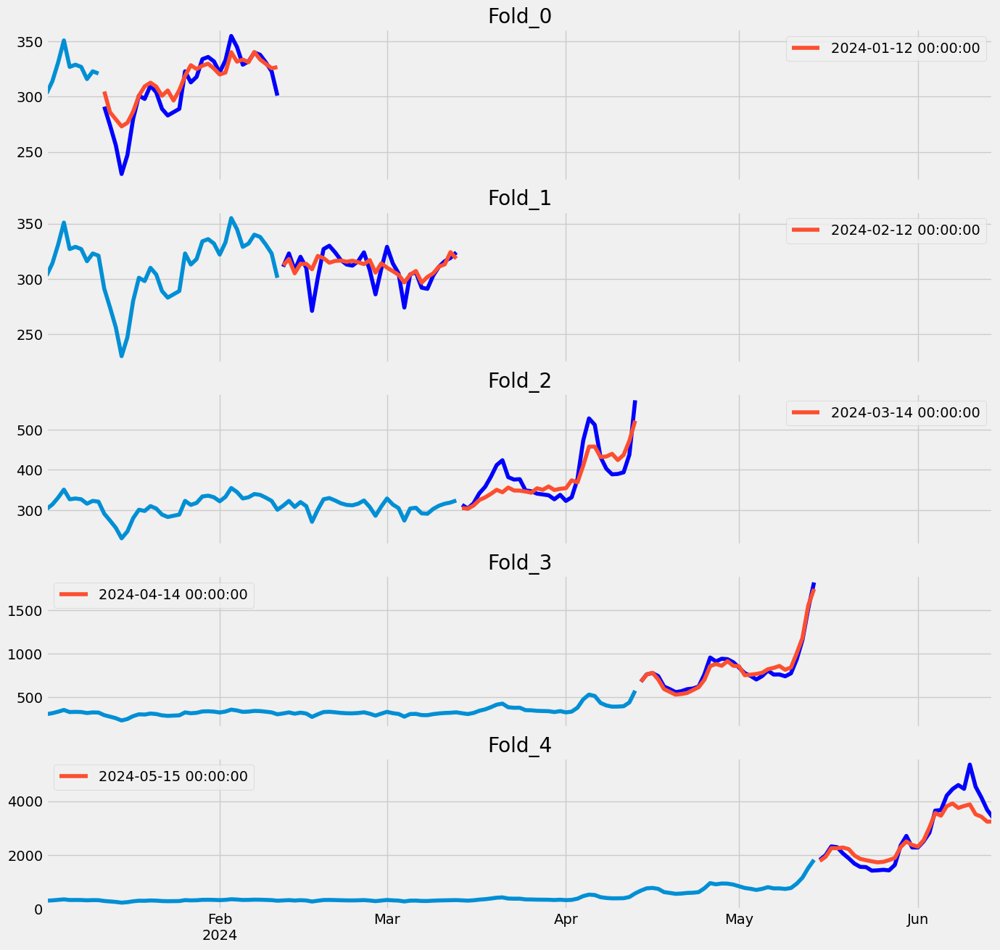

avg CV MAPE:


np.float64(0.06153933294117451)

In [41]:
future_data = df_and_future.query('is_future')

splits = future_data.shape[0] // n_future_models
tss = TimeSeriesSplit(n_splits=int(splits), test_size=n_future_models, gap=0)
fig, axs = plt.subplots(splits, 1, figsize=(15, 15), sharex=True)
mapes = []
t = []
p = []
fold = 0
for train_idx, val_idx in tss.split(future_data):
    train = future_data.iloc[train_idx]
    test = future_data.iloc[val_idx]
    pred = future_data.iloc[val_idx][[f'CFS_pred{n}ahead' for n in range(n_future_models)]]
    pred = pred.iloc[0].to_frame()
    # print(df.loc[test.index][FEATURES])
    # pred = pd.DataFrame([fmodel.predict(df.iloc[val_idx][FEATURES]) for fmodel in future_models.values()], columns=["pred"])
    pred.index = test.index

    train["CFS"].plot(ax=axs[fold], label="TRAIN", title=f"Fold_{fold}")
    test["CFS"].plot(ax=axs[fold], label="TEST", color="blue")
    pred.plot(ax=axs[fold], label="red")
    mapes.append(mean_absolute_percentage_error(test["CFS"], pred.values))
    t.extend(test["CFS"])
    p.extend(pred.values)
    fold += 1
plt.show()
print("avg CV MAPE:")
np.mean(mapes)

/var/folders/wg/5g_37w5920gg12w48ly3r9qh0000gn/T/ipykernel_12088/1332277855.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  residuals = [float(actual - predicted) for actual, predicted in zip(t, p)]


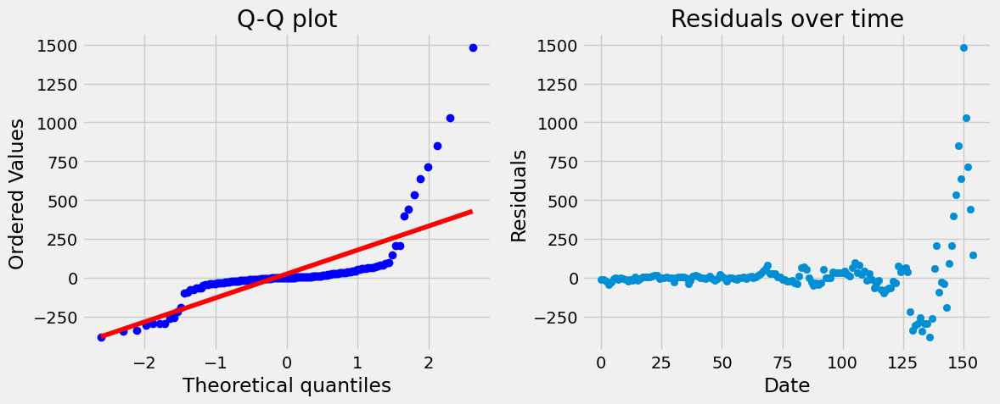

In [55]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

residuals = [float(actual - predicted) for actual, predicted in zip(t, p)]
stats.probplot(residuals, dist="norm", plot=ax1)
ax1.set_title("Q-Q plot")

ax2.scatter(range(0, len(residuals)), residuals)
ax2.set_title("Residuals over time")
ax2.set_xlabel("Date")
ax2.set_ylabel("Residuals")

plt.tight_layout()
plt.show()

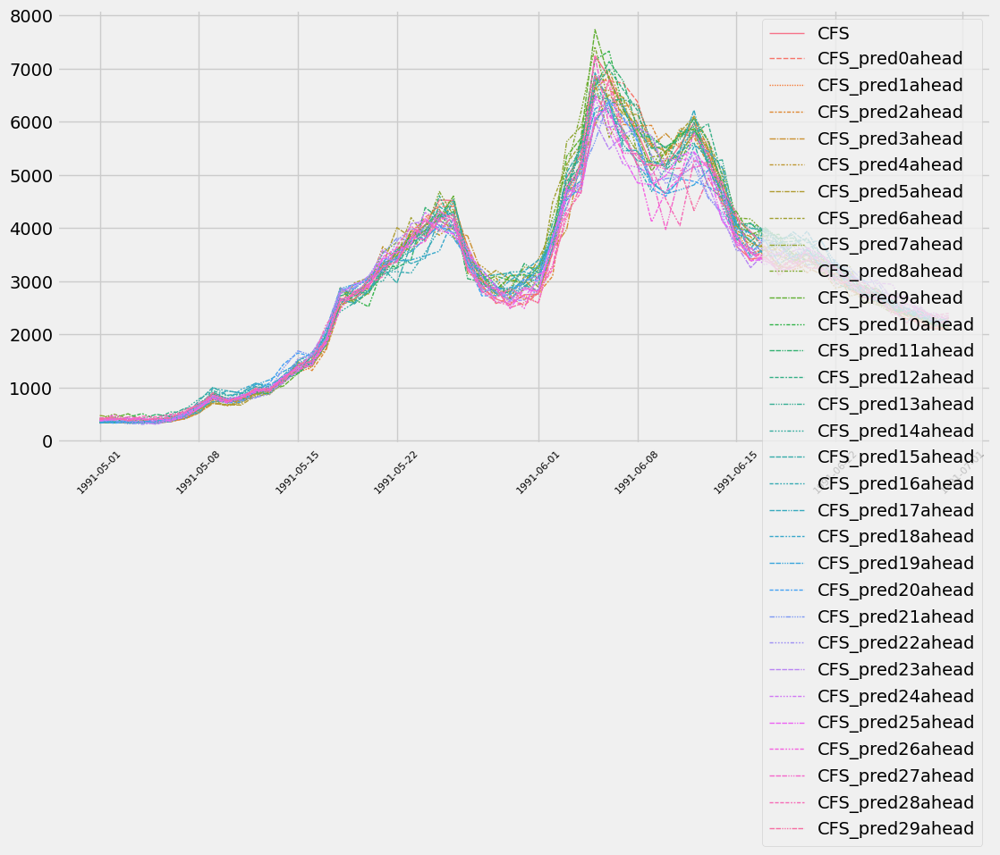

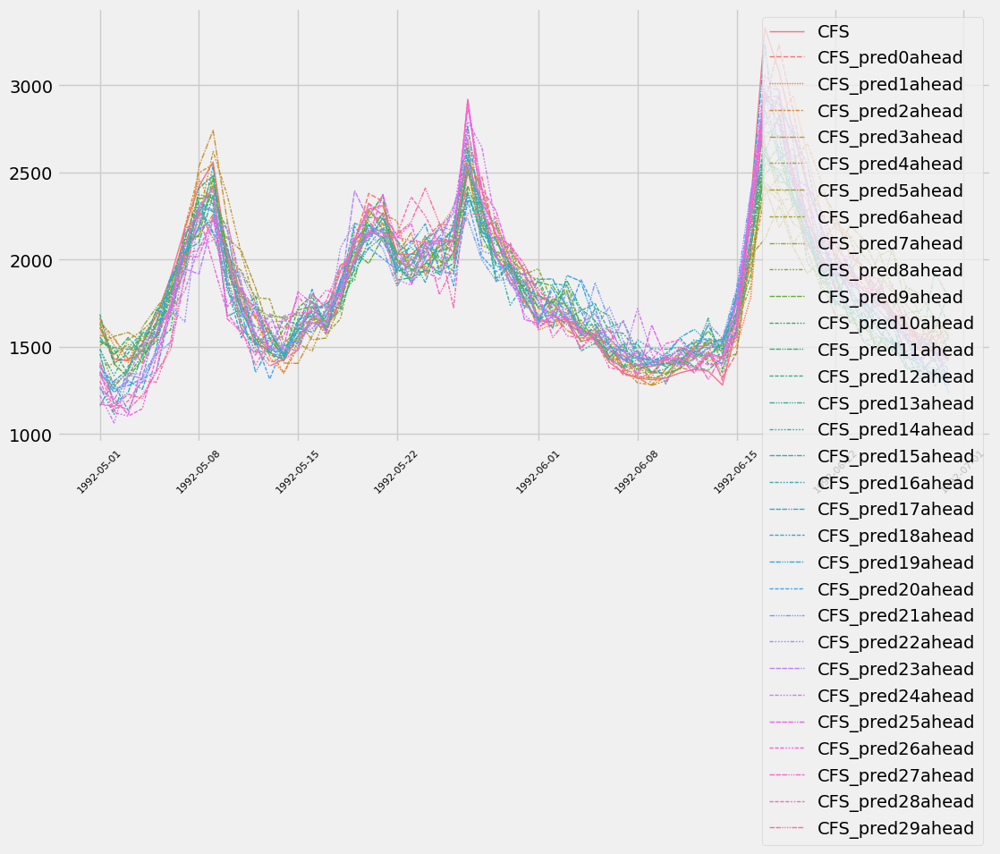

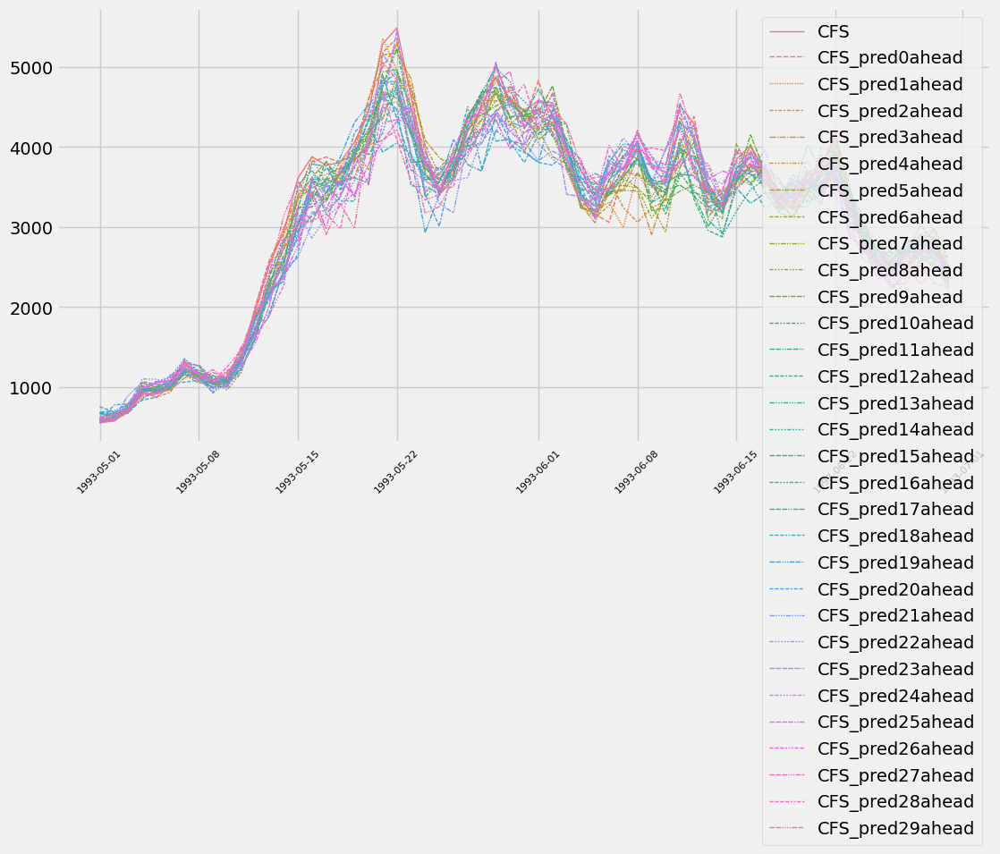

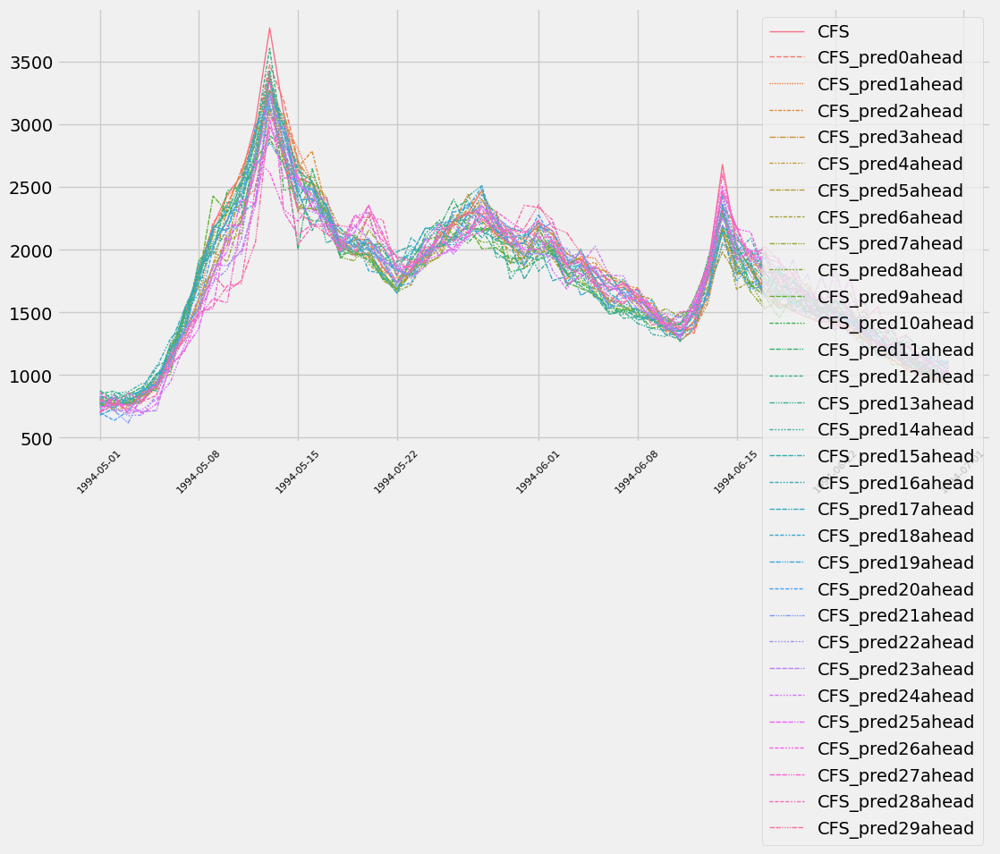

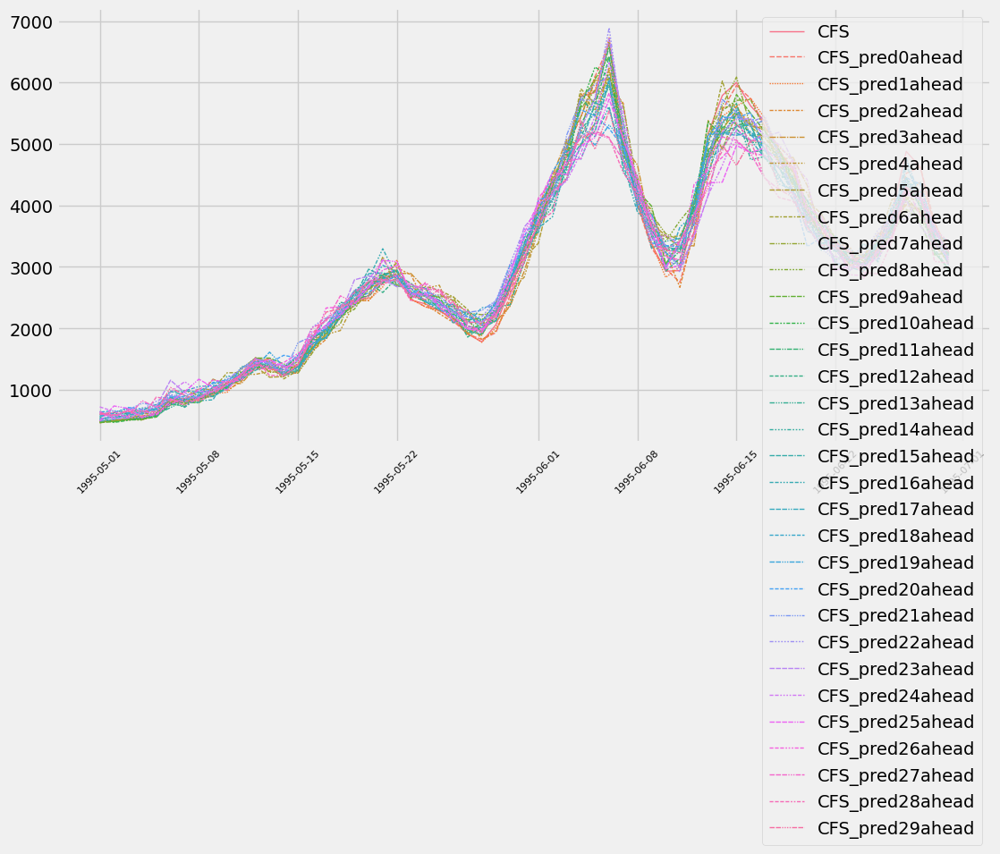

...

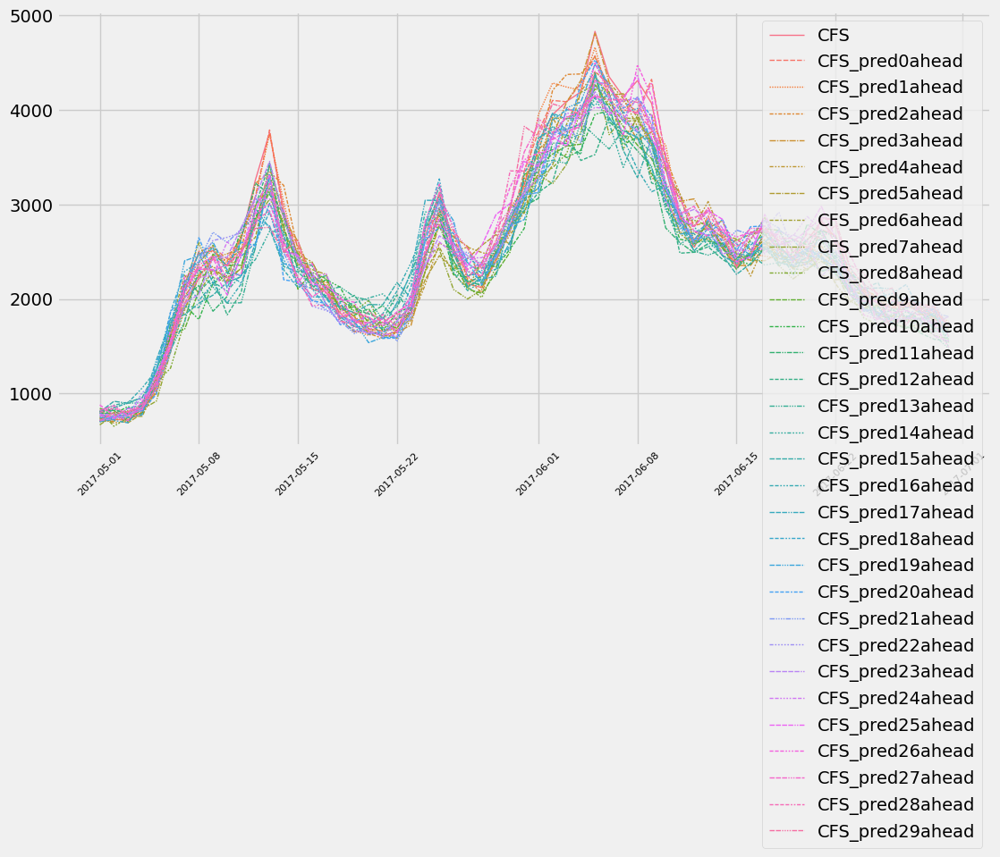

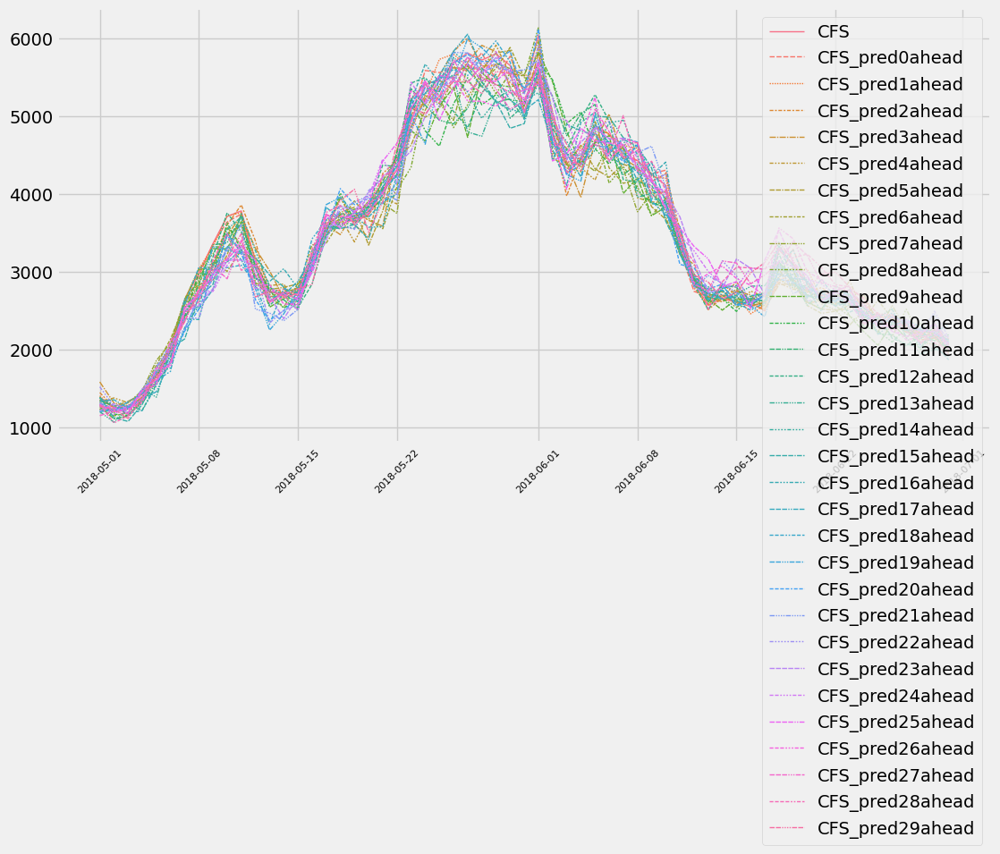

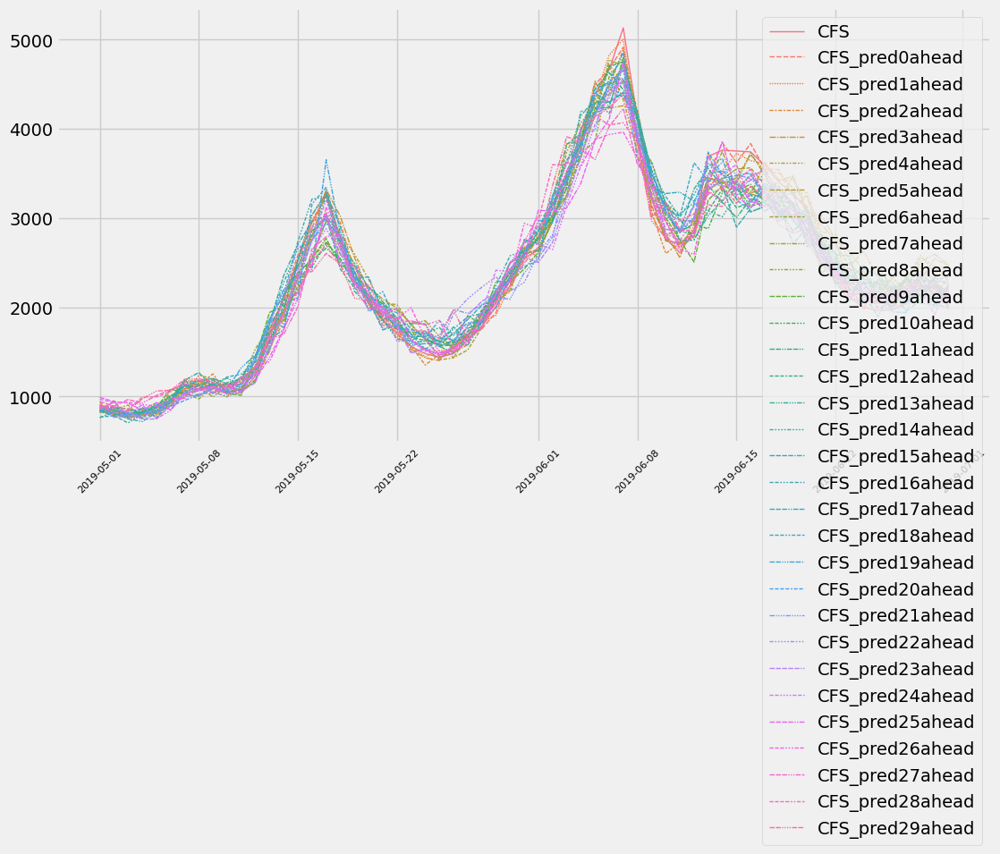

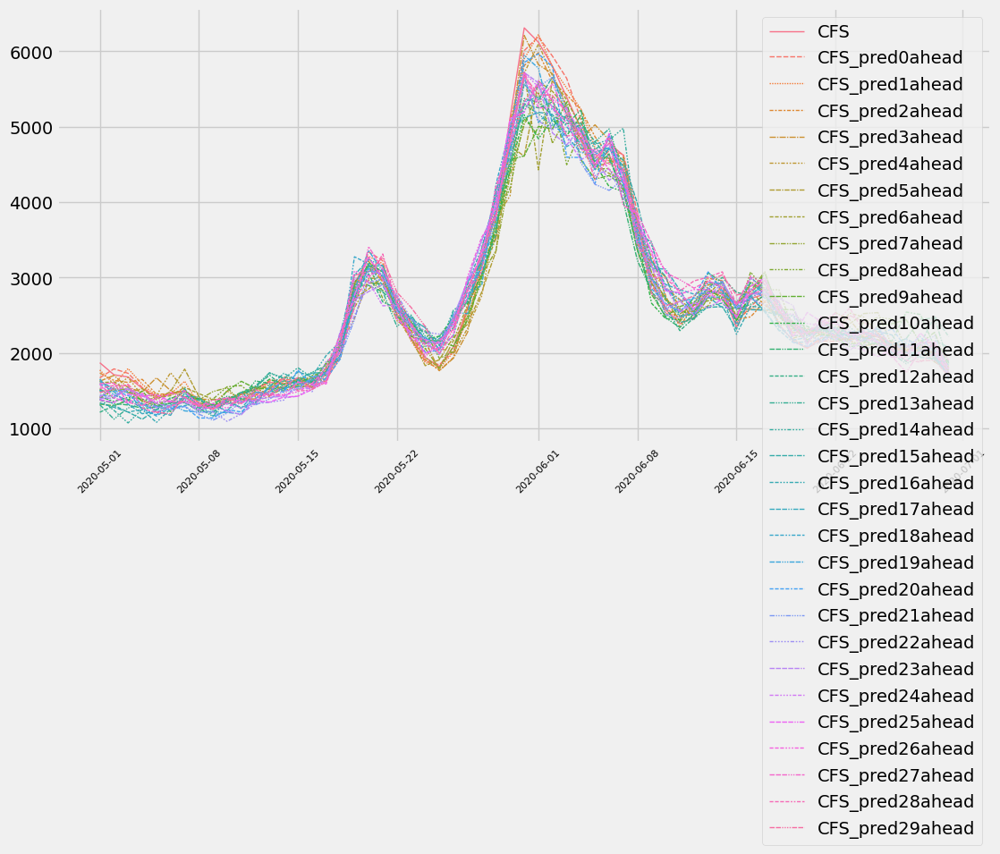

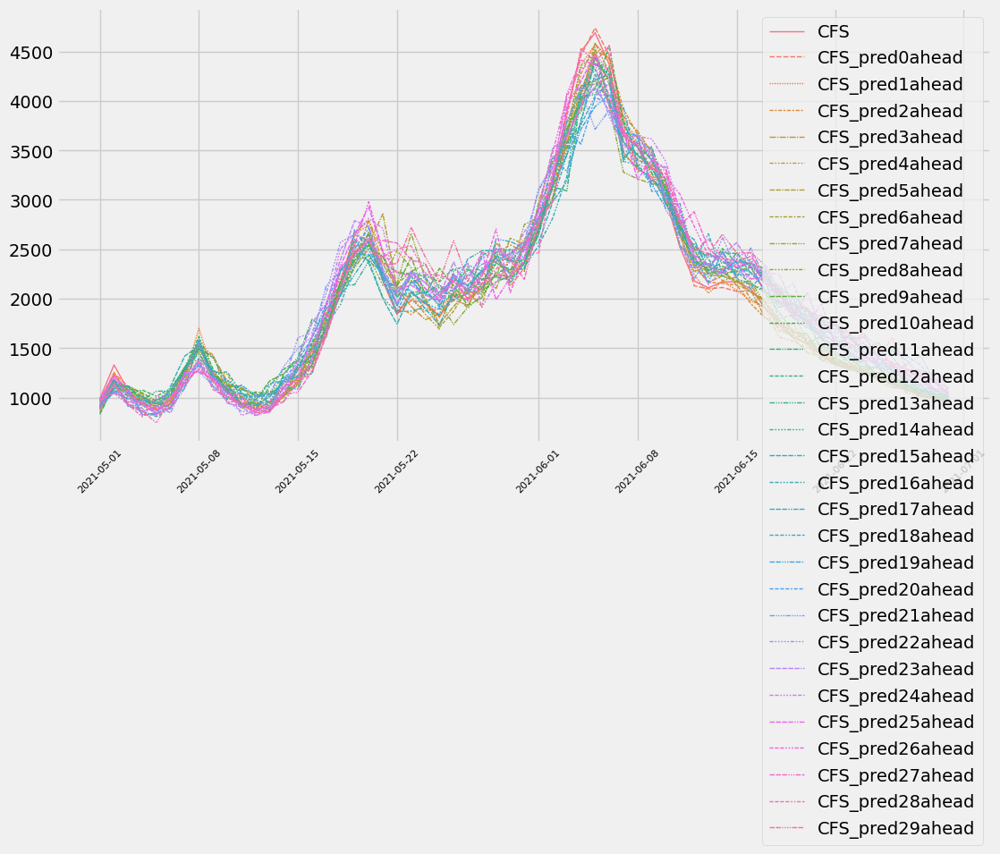

In [106]:
show_how_many_ahead = 30
for year in range(1991, 2022):
    temp = df_and_future.copy()
    which_cols = [f"CFS_pred{i}ahead" for i in range(show_how_many_ahead)]
    for idx, which_col in enumerate(which_cols):
        temp[which_col] = temp[which_col].shift(idx)
    from_date = pd.to_datetime(f"{year}-05-01")
    window_size = 60
    windowed_data = temp.loc[temp.index >= from_date]
    windowed_data = windowed_data.loc[windowed_data.index <= from_date + pd.Timedelta(days=window_size)]
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=windowed_data[[
        "CFS",
        *which_cols,
        ]], linewidth=1)
    plt.xticks(rotation=45, fontsize=8)
    plt.show()

In [68]:

df_and_future

,TAVG_origValue,WTEQ_average,WTEQ_origValue,year,quarter,month,week,dayofyear,CFS,CFS_lag1,...,CFS_pred21ahead,CFS_pred22ahead,CFS_pred23ahead,CFS_pred24ahead,CFS_pred25ahead,CFS_pred26ahead,CFS_pred27ahead,CFS_pred28ahead,CFS_pred29ahead,CFS_pred30ahead
1990-01-01,19.2,9.9,11.4,1990.0,1.0,1,1,1,275,NaN,...,1131.028687,1093.814575,985.905396,1174.659668,972.447449,1183.619751,1242.870361,1182.583374,1101.165161,1107.465698
1990-01-02,10.9,10.0,11.8,1990.0,1.0,1,1,2,290,275.0,...,321.490295,298.750946,301.698700,298.788116,378.833069,386.982605,392.257904,333.476593,344.033569,357.280762
1990-01-03,3.9,10.1,11.8,1990.0,1.0,1,1,3,258,290.0,...,286.077118,276.593414,266.253754,269.385315,268.140533,271.364838,277.229858,275.383331,273.282501,272.910461
1990-01-04,11.5,10.2,12.0,1990.0,1.0,1,1,4,249,258.0,...,282.380585,263.057709,275.411316,273.832977,277.276520,281.170380,273.652191,266.297180,261.790344,267.904755
1990-01-05,14.5,10.3,12.0,1990.0,1.0,1,1,5,269,249.0,...,279.747467,268.555756,279.616241,279.753876,278.895447,282.852631,279.238617,271.614929,267.066254,267.310364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-06-10,43.7,12.3,9.8,NaN,NaN,6,24,162,5360,4460.0,...,2971.513428,2877.171387,2865.328369,2832.513428,2862.190430,2816.855713,2658.887451,2757.400879,2745.366211,2815.146240
2024-06-11,47.3,11.9,8.3,NaN,NaN,6,24,163,4540,5360.0,...,2860.617188,2604.676270,2717.067871,2912.997070,2709.256348,2830.990479,2637.083984,2812.150391,2596.560059,2610.663330
2024-06-12,48.4,11.3,7.0,NaN,NaN,6,24,164,4140,4540.0,...,2931.110596,2830.393799,2899.256104,2871.020508,2840.595215,2836.182861,2865.190430,3000.632812,3044.443359,2906.814209
2024-06-13,49.3,10.7,5.6,NaN,NaN,6,24,165,3680,4140.0,...,2627.129883,2645.190674,2836.641357,2799.027832,2733.832520,2703.705566,2730.475342,2832.198975,2768.817383,2632.461670
